In [1]:
!pip install transformers datasets sentencepiece

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.0/7.0 MB 94.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 468.7/468.7 kB 42.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 80.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 200.1/200.1 kB 27.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 57.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.5/110.5 kB 10.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.2/212.2 kB 23.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 132.9/132.9 kB 16.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 71.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 269.3/269.3 kB 34.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.2/114.2 kB 14.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━

In [2]:

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [1]:
import tensorflow as tf
from transformers import AutoTokenizer, AdamWeightDecay, TFAutoModelForSeq2SeqLM
from transformers.keras_callbacks import KerasMetricCallback
from transformers.keras_callbacks import PushToHubCallback
from transformers import AutoModelForSeq2SeqLM, DataCollatorForSeq2Seq, Seq2SeqTrainingArguments, Seq2SeqTrainer
import numpy as np
from datasets import load_metric
from nltk.translate.bleu_score import sentence_bleu
from datasets import load_dataset
# import evaluate
from transformers import GPT2Tokenizer, GPT2Model
from transformers import MBartForConditionalGeneration, MBart50TokenizerFast
from transformers import AutoModelWithLMHead, AutoTokenizer
from datasets import Dataset
import pandas as pd
from sklearn.model_selection import train_test_split
import torch 
from tensorflow.keras.preprocessing.text import Tokenizer
import string
import pickle
from nltk.translate.bleu_score import sentence_bleu
from nltk.translate.bleu_score import SmoothingFunction

from PIL import Image
import requests
from io import BytesIO
device = torch.cuda

In [ ]:
train = pickle.load(open('/content/drive/MyDrive/Information Retrieval Project/common_gen_17k_files/train_set.pkl', 'rb'))
val = pickle.load(open('/content/drive/MyDrive/Information Retrieval Project/common_gen_17k_files/val_set.pkl', 'rb'))
test = pickle.load(open('/content/drive/MyDrive/Information Retrieval Project/common_gen_17k_files/test_set.pkl', 'rb'))

In [2]:
model = AutoModelWithLMHead.from_pretrained('/content/drive/MyDrive/Information Retrieval Project/saved_models/common_gen_7k_model').cuda()

/usr/local/lib/python3.9/dist-packages/transformers/models/auto/modeling_auto.py:1322: FutureWarning: The class `AutoModelWithLMHead` is deprecated and will be removed in a future version. Please use `AutoModelForCausalLM` for causal language models, `AutoModelForMaskedLM` for masked language models and `AutoModelForSeq2SeqLM` for encoder-decoder models.
  warnings.warn(


In [3]:
tokenizer = AutoTokenizer.from_pretrained('/content/drive/MyDrive/Information Retrieval Project/saved_models/common_gen_7k_model')

In [4]:
emoji_model = AutoModelWithLMHead.from_pretrained('/content/drive/MyDrive/Information Retrieval Project/saved_models/common_gen_emoji_new').cuda()

In [83]:
hashtag_model = AutoModelWithLMHead.from_pretrained("/content/drive/MyDrive/Information Retrieval Project/Instagram worthy captions dataset/t5_hashtag_model_10_epochs_2").cuda()

/usr/local/lib/python3.9/dist-packages/transformers/models/auto/modeling_auto.py:1322: FutureWarning: The class `AutoModelWithLMHead` is deprecated and will be removed in a future version. Please use `AutoModelForCausalLM` for causal language models, `AutoModelForMaskedLM` for masked language models and `AutoModelForSeq2SeqLM` for encoder-decoder models.
  warnings.warn(


In [6]:
emoji_tokenizer = AutoTokenizer.from_pretrained('/content/drive/MyDrive/Information Retrieval Project/saved_models/common_gen_emoji_new')

In [7]:
# special_tokens = ['<SOS>', '<EOS>', 'write creatively: ']
# tokenizer.add_tokens(special_tokens, special_tokens=True)
# emoji_tokenizer.add_tokens(special_tokens, special_tokens = True)

1

In [ ]:
prefix = 'write creatively: '

In [ ]:
max_len = 0
for pair in train:
  max_len = max(max_len, len(pair['Original Caption'].split()), len(pair['Creative Caption'].split()))

for pair in val:
  max_len = max(max_len, len(pair['Original Caption'].split()), len(pair['Creative Caption'].split()))

for pair in test:
  max_len = max(max_len, len(pair['Original Caption'].split()), len(pair['Creative Caption'].split()))

max_len

47

In [ ]:
temp = prefix + test['Original Caption'][6]
# temp = prefix + 'vector illustration of a colorful shiny lamp for person with brown background'
temp = tokenizer(temp, max_length = max_len, truncation = True, padding = True, return_tensors = 'pt').input_ids
temp = model.generate(temp)

In [ ]:
temp

tensor([[    0, 32100,    96, 17175,  1222,     8,  1726,    21,     3,     9,
          8254,  3112,    55,     3,     2,     3, 32101,     1]])

In [ ]:
tokenizer.batch_decode(temp)

['<pad><SOS> "Setting the stage for a spectacular scene! <unk> <EOS></s>']

In [ ]:
test['Original Caption'][6]

'<SOS> "The crew setting up the scene." <EOS>'

### coco dataset

In [7]:
coco = pickle.load(open('/content/drive/MyDrive/Information Retrieval Project/FINAL SUBMISSION FILES/coco_df.pkl', 'rb'))

In [8]:
captions = coco.loc[:, ['Generated_descriptive_caption']]

In [9]:
captions = captions.applymap(lambda x: '<SOS> ' + x + ' <EOS>' if type(x) == str else x)

In [10]:
captions = captions.applymap(lambda x: 'write creatively: ' + x if type(x) == str else x)

In [11]:
stylised_captions = tokenizer(captions['Generated_descriptive_caption'].to_list(), max_length = 40, truncation = True, padding = True, return_tensors = 'pt').input_ids.cuda()

In [12]:
stylised_captions = model.generate(stylised_captions)

/usr/local/lib/python3.9/dist-packages/transformers/generation/utils.py:1313: UserWarning: Using `max_length`'s default (20) to control the generation length. This behaviour is deprecated and will be removed from the config in v5 of Transformers -- we recommend using `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


In [13]:
stylised_captions = tokenizer.batch_decode(stylised_captions)

In [14]:
coco['stylised_captions'] = stylised_captions

In [15]:
coco.loc[: , ['stylised_captions']] = coco.loc[:, ['stylised_captions']].applymap(lambda x: x.replace('<pad>', ''))
coco.loc[: , ['stylised_captions']] = coco.loc[:, ['stylised_captions']].applymap(lambda x: x.replace('<SOS>', ''))
coco.loc[: , ['stylised_captions']] = coco.loc[:, ['stylised_captions']].applymap(lambda x: x.replace('<EOS>', ''))

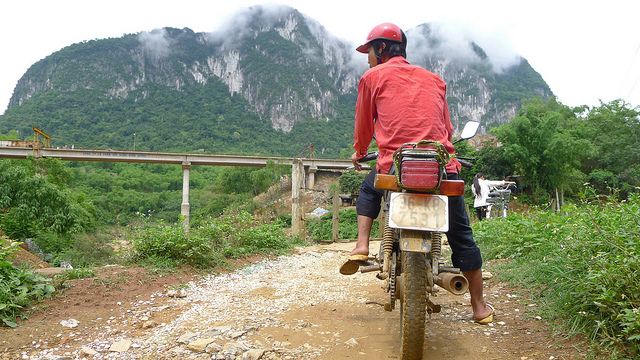

['A man with a red helmet on a small moped on a dirt road. ', 'Man riding a motor bike on a dirt road on the countryside.', 'A man riding on the back of a motorcycle.', 'A dirt path with a young person on a motor bike rests to the foreground of a verdant area with a bridge and a background of cloud-wreathed mountains. ', 'A man in a red shirt and a red hat is on a motorcycle on a hill side.']
a man riding a motorcycle on a dirt road 
 "Riding through the dirt with my friends" </s>



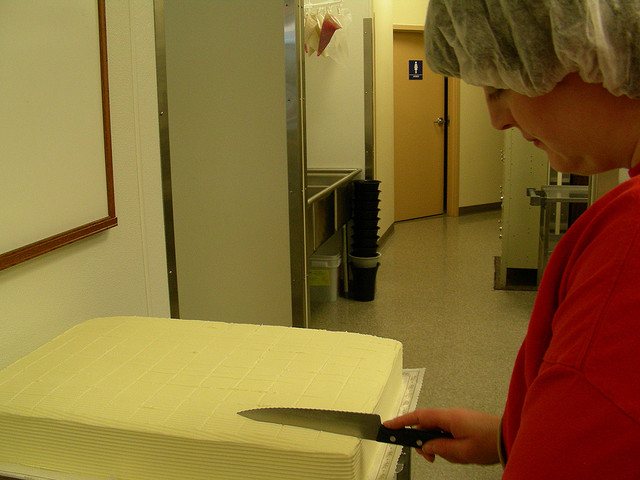

['A woman wearing a net on her head cutting a cake. ', 'A woman cutting a large white sheet cake.', 'A woman wearing a hair net cutting a large sheet cake.', 'there is a woman that is cutting a white cake', "A woman marking a cake with the back of a chef's knife. "]
a woman cutting a cake with a knife 
 "Cake cutting skills! Woman using a knife to cut a cake 



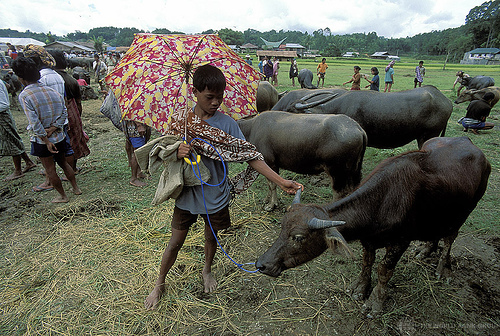

['A child holding a flowered umbrella and petting a yak.', 'A young man holding an umbrella next to a herd of cattle.', 'a young boy barefoot holding an umbrella touching the horn of a cow', 'A young boy with an umbrella who is touching the horn of a cow.', 'A boy holding an umbrella while standing next to livestock.']
a young boy holding an umbrella while standing in a field 
 "Under the umbrella, I can see the beauty of nature. <unk> 



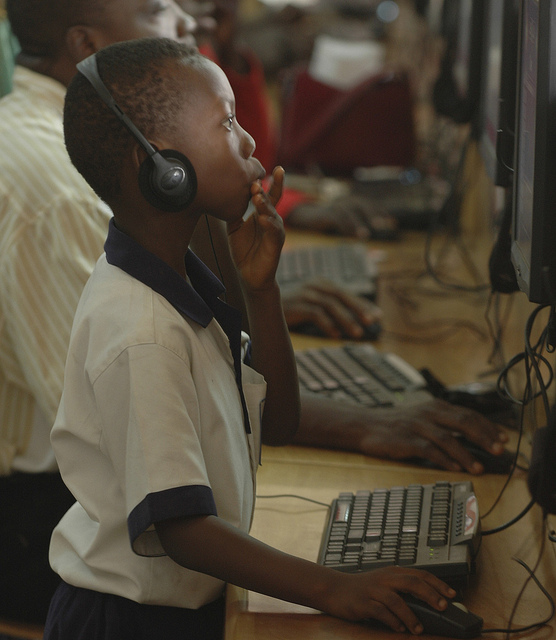

['A young boy standing in front of a computer keyboard.', 'a little boy wearing headphones and looking at a computer monitor', 'He is listening intently to the computer at school.', 'A young boy stares up at the computer monitor.', 'a young kid with head phones on using a computer ']
a young boy is using a computer while sitting at a desk 
 "An inspiring moment as a young boy uses a computer while sitting at 



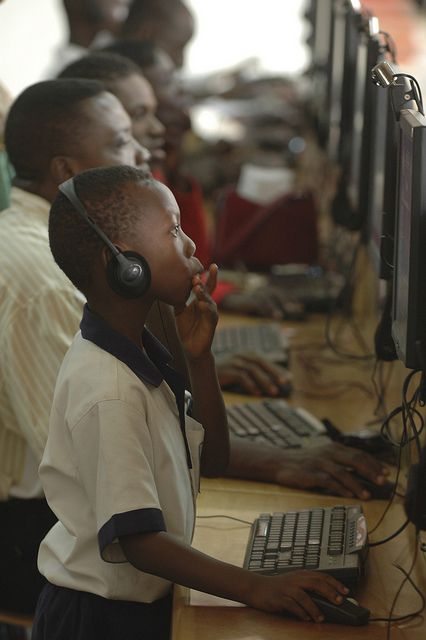

['a boy wearing headphones using one computer in a long row of computers', 'A little boy with earphones on listening to something.', 'A group of people sitting at desk using computers.', 'Children sitting at computer stations on a long table.', 'A small child wearing headphones plays on the computer.']
a boy in a black shirt and a black and white computer 
 "Sweet and confident, a boy in a black shirt and white



In [ ]:
for i in range(5):
  response = requests.get(coco.loc[i, ['url']][0])
  img = Image.open(BytesIO(response.content))
  img.show()
  print(coco.loc[i, ['captions']][0])
  print(coco.loc[i, ['Generated_descriptive_caption']][0])
  print(coco.loc[i, ['stylised_captions']][0])
  print()

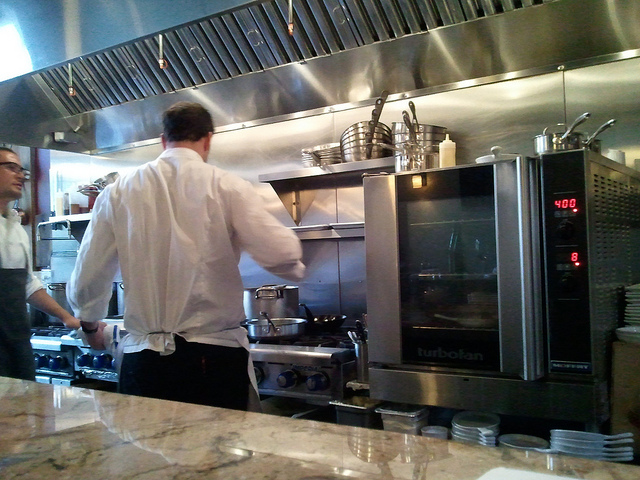

['Two chefs in a restaurant kitchen preparing food. ', 'Two cooks are cooking the food someone ordered at this restaurant', 'The chef is cooking with pans on the stove next to an oven. ', 'Two men that are standing in a kitchen.', 'Two cooks are near the stove in a stainless steel kitchen.']
a chef in a kitchen preparing food in a restaurant 
 "Cooking up deliciousness in the kitchen" </s>



In [ ]:
response = requests.get(coco.loc[10, ['url']][0])
img = Image.open(BytesIO(response.content))
img.show()
print(coco.loc[10, ['captions']][0])
print(coco.loc[10, ['Generated_descriptive_caption']][0])
print(coco.loc[10, ['stylised_captions']][0])
print()

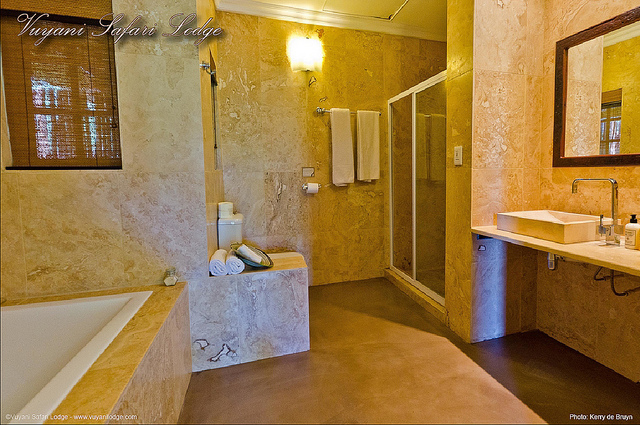

['The bathroom is clean for the guests to use. ', 'A bath and a sink in a room.', 'A bathroom area with tub, sink and standup shower.', 'a view of a bathroom which is covered in tiles.', 'A kitchen is shown with a tub and a sink.']
a bathroom with a tub, sink, and shower 
 "Spacious bathroom with a tub, sink, and shower" </s>



In [ ]:
response = requests.get(coco.loc[50, ['url']][0])
img = Image.open(BytesIO(response.content))
img.show()
print(coco.loc[50, ['captions']][0])
print(coco.loc[50, ['Generated_descriptive_caption']][0])
print(coco.loc[50, ['stylised_captions']][0])
print()

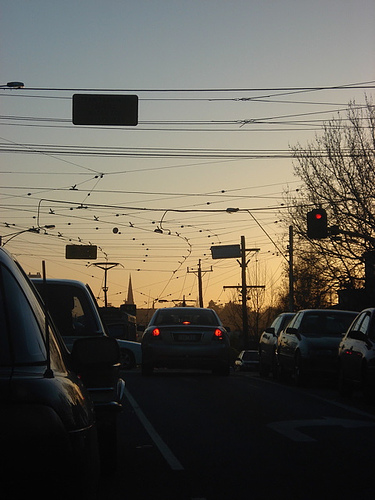

['A city street filled with traffic and parking lights.', 'A full view of a late evening with many cars parked on the street.', 'A very dark street with cars and many wires above.', "A car's break lights glow as it waits at a red-light at an intersection.", 'A street scene with cars, street signs, and many high wires.']
a street filled with lots of traffic and cars 
 "A bustling street filled with traffic and cars, a bustling cityscape that



In [ ]:
response = requests.get(coco.loc[69, ['url']][0])
img = Image.open(BytesIO(response.content))
img.show()
print(coco.loc[69, ['captions']][0])
print(coco.loc[69, ['Generated_descriptive_caption']][0])
print(coco.loc[69, ['stylised_captions']][0])
print()

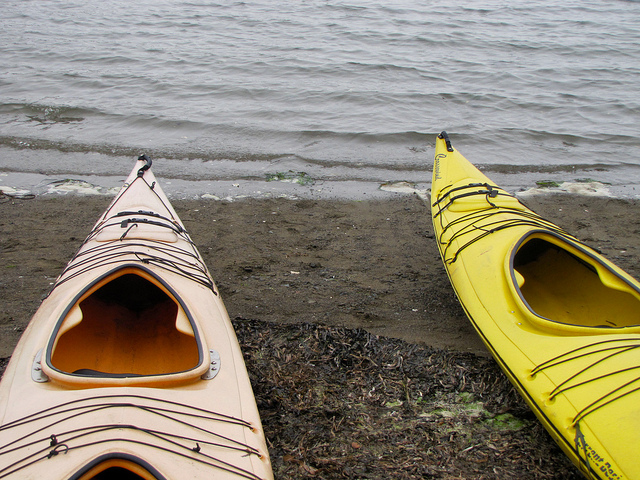

['Two kayaks, one pink the other yellow, on bank of water. ', 'Two kayaks rest on the shore of a body of water.', 'Two kayaks sitting on the shore of a body of water.', 'Two kayaks are shown on the shore. ', 'Two kayaks are sitting on a river bank empty.']
two yellow surfboards sitting on the beach 
 Surfing with joy and style <unk> </s>



In [ ]:
response = requests.get(coco.loc[420, ['url']][0])
img = Image.open(BytesIO(response.content))
img.show()
print(coco.loc[420, ['captions']][0])
print(coco.loc[420, ['Generated_descriptive_caption']][0])
print(coco.loc[420, ['stylised_captions']][0])
print()

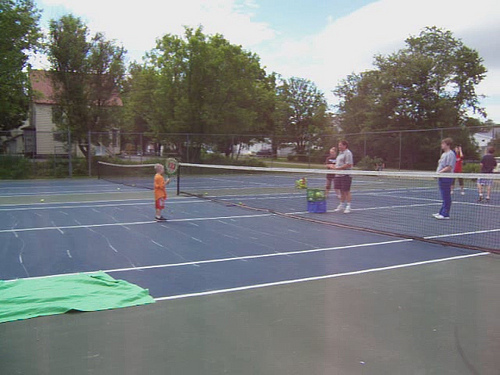

['A group of people that are standing on a tennis court.', 'A group of people who are on a tennis court.', 'a few people that are playing tennis on a court', 'A group of people standing on top of a tennis court.', 'some people standing on a tennis court holding tennis racketts']
people standing on a tennis court 
 "Tennis vibes! People enjoying the game on the tennis court <unk>



In [ ]:
response = requests.get(coco.loc[902, ['url']][0])
img = Image.open(BytesIO(response.content))
img.show()
print(coco.loc[902, ['captions']][0])
print(coco.loc[902, ['Generated_descriptive_caption']][0])
print(coco.loc[902, ['stylised_captions']][0])
print()

In [16]:
bleu_score = []
smoothing = SmoothingFunction()
for i in range(len(coco)):
  # print(test[i]['Original Caption'], ' space ',model_outputs[i])
  bleu_score.append(round(sentence_bleu([coco.loc[i, ['Generated_descriptive_caption']][0]], coco.loc[i, ['stylised_captions']][0], smoothing_function = smoothing.method1), 4))


In [17]:
avg_bleu_score = sum(bleu_score)/len(bleu_score)

In [18]:
coco['stylised_bleu_score'] = bleu_score

### conceptual

In [19]:
conceptual = pickle.load(open('/content/drive/MyDrive/Information Retrieval Project/FINAL SUBMISSION FILES/conceptual_df.pkl', 'rb'))

In [20]:
conceptual

,Original Caption,Image,Generated_descriptive_caption,rouge_score,bleu_score,meteor_score
1000,sparkling glittery gold uppercase or capital l...,https://thumb1.shutterstock.com/display_pic_wi...,a white and black vase with a bird on it,0.400000,1.439933e-231,0.263158
1001,actor arrives for the premiere,https://media.gettyimages.com/photos/kristen-b...,a woman in a red dress standing in front of a ...,0.000000,1.212316e-231,0.238095
1002,i jumped out of a helicopter and you can see t...,http://i.imgur.com/ynzWXIO.jpg,a person holding a surfboard in their hand,0.250000,1.422890e-231,0.294118
1003,athlete prepares to score a touchdown as his t...,http://photos.mycapture.com/THST/1561986/44629...,#,0.000000,0.000000e+00,0.000000
1004,baseball player shakes hands with baseball pla...,https://billieweiss.files.wordpress.com/2014/0...,#,0.000000,0.000000e+00,0.000000
...,...,...,...,...,...,...
1995,a bit of the view from our table on new year '...,https://media-cdn.tripadvisor.com/media/photo-...,a city with lots of buildings and a river,0.222222,1.474056e-231,0.277778
1996,actor wears a slim grey suit to awards .,http://www.windsorstar.com/cms/binary/6493391....,#,0.000000,0.000000e+00,0.000000
1997,a side street viewed not .,https://www.jefflindsay.com/gif/asia/shanghai_...,"a sign that says ""don't drink in the city""",0.100000,1.265148e-231,0.238095
1998,map with long shadow and white outline on blue...,https://thumb1.shutterstock.com/display_pic_wi...,#,0.000000,0.000000e+00,0.000000


In [21]:
captions = conceptual.loc[:, ['Generated_descriptive_caption']]

In [22]:
captions = captions.applymap(lambda x: '<SOS> ' + x + ' <EOS>')
captions = captions.applymap(lambda x: 'write creatively: ' + x)

In [23]:
stylised_captions = tokenizer(captions['Generated_descriptive_caption'].to_list(), max_length = 47, truncation = True, padding = True, return_tensors = 'pt').input_ids.cuda()

In [24]:
stylised_captions = model.generate(stylised_captions)

/usr/local/lib/python3.9/dist-packages/transformers/generation/utils.py:1313: UserWarning: Using `max_length`'s default (20) to control the generation length. This behaviour is deprecated and will be removed from the config in v5 of Transformers -- we recommend using `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


In [25]:
stylised_captions = tokenizer.batch_decode(stylised_captions)

In [26]:
conceptual['stylised_captions'] = stylised_captions

In [27]:
conceptual.loc[:, ['stylised_captions']] = conceptual.loc[:, ['stylised_captions']].applymap(lambda x: x.replace('<pad>', ''))
conceptual.loc[:, ['stylised_captions']] = conceptual.loc[:, ['stylised_captions']].applymap(lambda x: x.replace('<SOS>', ''))
conceptual.loc[:, ['stylised_captions']] = conceptual.loc[:, ['stylised_captions']].applymap(lambda x: x.replace('<EOS>', ''))

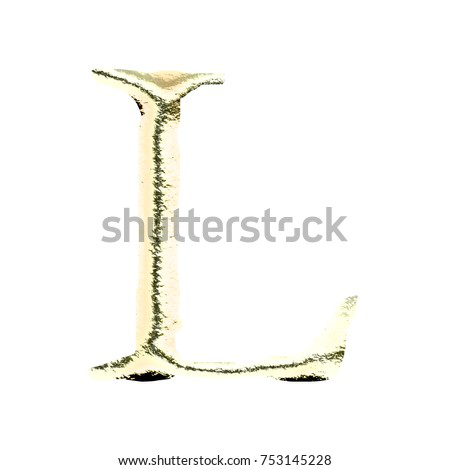

sparkling glittery gold uppercase or capital letter l in a 3d illustration with a bright golden color and rough chiseled metallic surface jagged font isolated on a white background with clipping path .
a white and black vase with a bird on it 
 "A bird's eye view from a white and black vase, showcasing



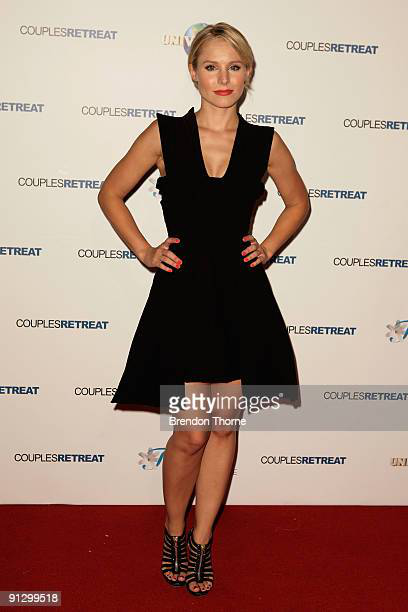

actor arrives for the premiere
a woman in a red dress standing in front of a wall 
 "Styling up like a queen in a red dress, surrounded



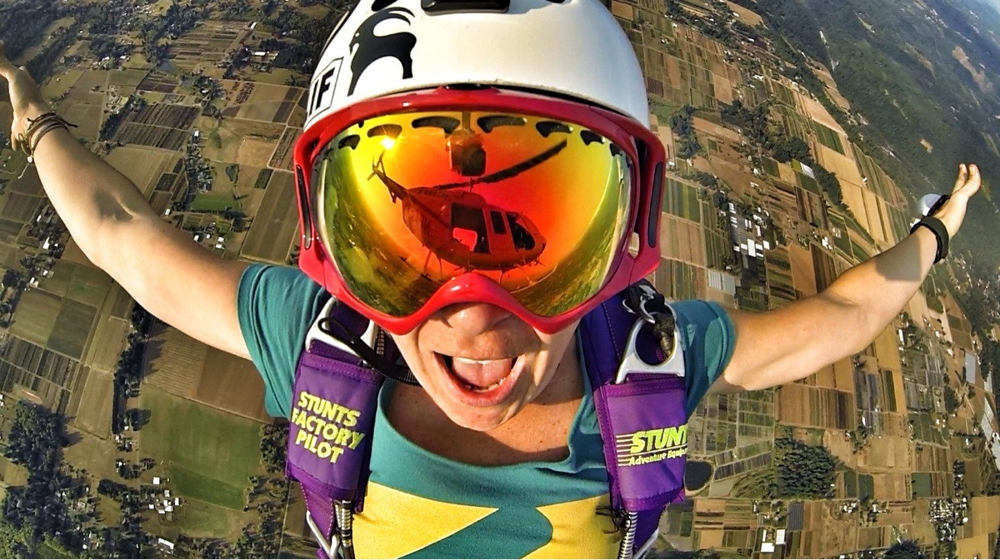

i jumped out of a helicopter and you can see the reflection in my goggles .
a person holding a surfboard in their hand 
 Surfing with joy <unk> </s>



KeyboardInterrupt: ignored

In [ ]:
for i in range(5):
  response = requests.get(conceptual.loc[1000+i, ['Image']][0])
  img = Image.open(BytesIO(response.content))
  img.show()
  print(conceptual.loc[1000+i, ['Original Caption']][0])
  print(conceptual.loc[1000+i, ['Generated_descriptive_caption']][0])
  print(conceptual.loc[1000+i, ['stylised_captions']][0])
  print()

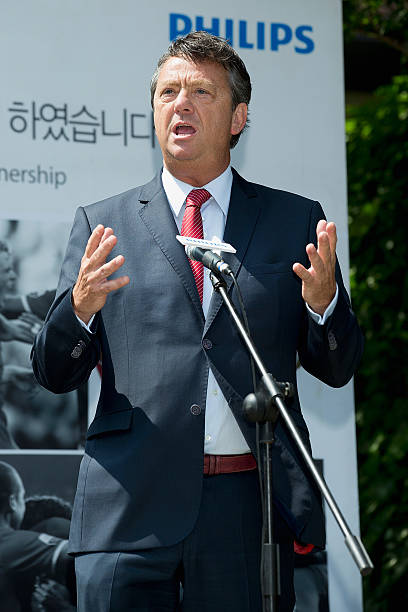

person attends the promotional event .
a man in a suit and tie speaking to a crowd 
 "Speaking like a boss" <unk> </s>



In [ ]:
response = requests.get(conceptual.loc[1006, ['Image']][0])
img = Image.open(BytesIO(response.content))
img.show()
print(conceptual.loc[1006, ['Original Caption']][0])
print(conceptual.loc[1006, ['Generated_descriptive_caption']][0])
print(conceptual.loc[1006, ['stylised_captions']][0])
print()

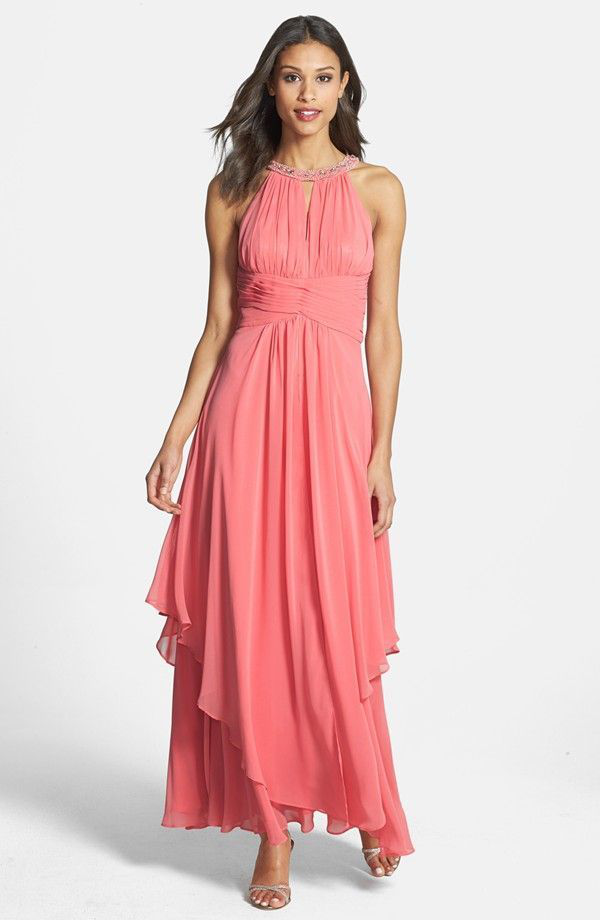

coral mother of the bride dress for a beach wedding
a woman in a pink dress standing in front of a wall 
 "Styling up like a princess" <unk> </s>



In [ ]:
response = requests.get(conceptual.loc[1050, ['Image']][0])
img = Image.open(BytesIO(response.content))
img.show()
print(conceptual.loc[1050, ['Original Caption']][0])
print(conceptual.loc[1050, ['Generated_descriptive_caption']][0])
print(conceptual.loc[1050, ['stylised_captions']][0])
print()

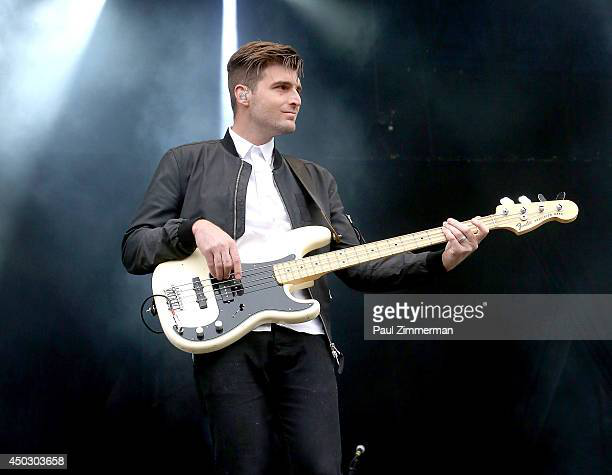

composer of electronic rock artist performs during festival
a man in a black shirt and a guitar playing 
 "Musical vibes! Man in black shirt and guitar playing <unk> </s>



In [ ]:
response = requests.get(conceptual.loc[1265, ['Image']][0])
img = Image.open(BytesIO(response.content))
img.show()
print(conceptual.loc[1265, ['Original Caption']][0])
print(conceptual.loc[1265, ['Generated_descriptive_caption']][0])
print(conceptual.loc[1265, ['stylised_captions']][0])
print()

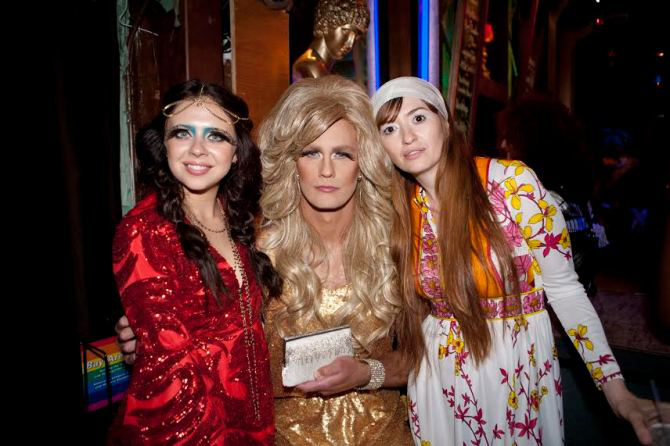

theatre actor , actors at the premiere of adaptation .
two women dressed in costumes standing next to each other 
 "Celebrating the beauty of women in costumes, we celebrate togetherness" 



In [ ]:
response = requests.get(conceptual.loc[1690, ['Image']][0])
img = Image.open(BytesIO(response.content))
img.show()
print(conceptual.loc[1690, ['Original Caption']][0])
print(conceptual.loc[1690, ['Generated_descriptive_caption']][0])
print(conceptual.loc[1690, ['stylised_captions']][0])
print()

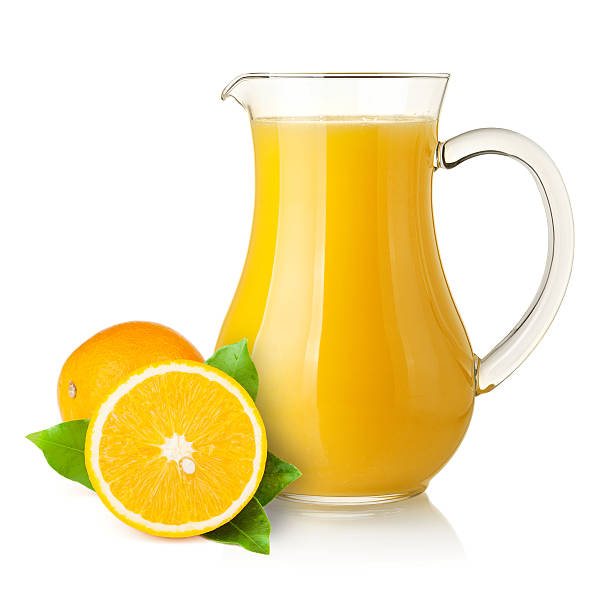

homemade orange juice in a pitcher
a glass of orange juice next to a green leaf 
 "Sweet and refreshing <unk> </s>



In [ ]:
response = requests.get(conceptual.loc[1800, ['Image']][0])
img = Image.open(BytesIO(response.content))
img.show()
print(conceptual.loc[1800, ['Original Caption']][0])
print(conceptual.loc[1800, ['Generated_descriptive_caption']][0])
print(conceptual.loc[1800, ['stylised_captions']][0])
print()

In [28]:
bleu_score = []
smoothing = SmoothingFunction()
for i in range(len(conceptual)):
  # print(test[i]['Original Caption'], ' space ',model_outputs[i])
  bleu_score.append(round(sentence_bleu([conceptual.loc[1000+i, ['Generated_descriptive_caption']][0]], conceptual.loc[1000+i, ['stylised_captions']][0], smoothing_function = smoothing.method1), 4))

In [29]:
avg_bleu_score = sum(bleu_score)/len(bleu_score)

In [30]:
avg_bleu_score

0.2474709999999999

In [32]:
conceptual

,Original Caption,Image,Generated_descriptive_caption,rouge_score,bleu_score,meteor_score,stylised_captions,stylised_bleu_score
1000,sparkling glittery gold uppercase or capital l...,https://thumb1.shutterstock.com/display_pic_wi...,a white and black vase with a bird on it,0.400000,1.439933e-231,0.263158,"""Nature's beauty in simplicity <unk> </s>",0.0247
1001,actor arrives for the premiere,https://media.gettyimages.com/photos/kristen-b...,a woman in a red dress standing in front of a ...,0.000000,1.212316e-231,0.238095,"""Styling up like a queen in a red dress, embr...",0.4103
1002,i jumped out of a helicopter and you can see t...,http://i.imgur.com/ynzWXIO.jpg,a person holding a surfboard in their hand,0.250000,1.422890e-231,0.294118,Surfing is my passion <unk> </s>,0.1230
1003,athlete prepares to score a touchdown as his t...,http://photos.mycapture.com/THST/1561986/44629...,#,0.000000,0.000000e+00,0.000000,"""Supporting the future of medicine! <unk> </s>",0.0000
1004,baseball player shakes hands with baseball pla...,https://billieweiss.files.wordpress.com/2014/0...,#,0.000000,0.000000e+00,0.000000,"""Supporting the future of medicine! <unk> </s>",0.0000
...,...,...,...,...,...,...,...,...
1995,a bit of the view from our table on new year '...,https://media-cdn.tripadvisor.com/media/photo-...,a city with lots of buildings and a river,0.222222,1.474056e-231,0.277778,"""City vibes! <unk> </s>",0.0647
1996,actor wears a slim grey suit to awards .,http://www.windsorstar.com/cms/binary/6493391....,#,0.000000,0.000000e+00,0.000000,"""Supporting the future of medicine! <unk> </s>",0.0000
1997,a side street viewed not .,https://www.jefflindsay.com/gif/asia/shanghai_...,"a sign that says ""don't drink in the city""",0.100000,1.265148e-231,0.238095,"""City drinking ban! <unk> </s>",0.1681
1998,map with long shadow and white outline on blue...,https://thumb1.shutterstock.com/display_pic_wi...,#,0.000000,0.000000e+00,0.000000,"""Supporting the future of medicine! <unk> </s>",0.0000


In [31]:
conceptual['stylised_bleu_score'] = bleu_score

### insta dataset

In [ ]:
insta = pickle.load(open('/content/drive/MyDrive/Information Retrieval Project/FINAL SUBMISSION FILES/insta_df.pkl', 'rb'))

In [ ]:
insta

,Image,Real_insta_caption,Generated_descriptive_caption,rouge_score,bleu_score
0,/content/drive/MyDrive/Information Retrieval P...,,#,0.0,0.000000e+00
1,/content/drive/MyDrive/Information Retrieval P...,,#,0.0,0.000000e+00
2,/content/drive/MyDrive/Information Retrieval P...,,#,0.0,0.000000e+00
3,/content/drive/MyDrive/Information Retrieval P...,,#,0.0,0.000000e+00
4,/content/drive/MyDrive/Information Retrieval P...,,#,0.0,0.000000e+00
...,...,...,...,...,...
5523,/content/drive/MyDrive/Information Retrieval P...,The rain is finally over in LA. Slide 3 to ce...,a man standing next to a woman on a sidewalk,0.2,1.360621e-231
5524,/content/drive/MyDrive/Information Retrieval P...,@miumiu spam sry sry sry sry 😘🙃\n,a woman in a black dress and black boots,0.0,1.126809e-231
5525,/content/drive/MyDrive/Information Retrieval P...,@miumiu spam sry sry sry sry 😘🙃\n,a black bag with a piece of paper on it,0.0,1.083268e-231
5526,/content/drive/MyDrive/Information Retrieval P...,15th Coachella for moi. Wearing @r_and_m_leath...,a woman in a black dress and a black skirt,0.1,1.350912e-231


In [ ]:
insta = insta[insta['Generated_descriptive_caption'] != '#']

In [ ]:
insta = insta.reset_index(drop = True)

In [ ]:
insta

,Image,Real_insta_caption,Generated_descriptive_caption,rouge_score,bleu_score
0,/content/drive/MyDrive/Information Retrieval P...,📍Machu Picchu | Follow TravelTuesday to discov...,a number of people standing on top of a hill,0.000000,1.448850e-231
1,/content/drive/MyDrive/Information Retrieval P...,📍Bora Bora | Follow TravelTuesday to discover ...,a boat is docked in the water near a beach,0.000000,1.376174e-231
2,/content/drive/MyDrive/Information Retrieval P...,Click the link in our bio to learn how to cult...,a woman with a hat and glasses is talking on a...,0.000000,1.340490e-231
3,/content/drive/MyDrive/Information Retrieval P...,We're excited to elevate our look with these s...,a woman in a blue shirt and a picture of a man,0.083333,1.452688e-231
4,/content/drive/MyDrive/Information Retrieval P...,"""Finally. That’s me—that’s who I am.""⁠\n⁠\nRea...",a woman in a bikini taking a picture of herself,0.100000,1.445062e-231
...,...,...,...,...,...
4102,/content/drive/MyDrive/Information Retrieval P...,The rain is finally over in LA. Slide 3 to ce...,a man standing next to a woman on a sidewalk,0.200000,1.360621e-231
4103,/content/drive/MyDrive/Information Retrieval P...,@miumiu spam sry sry sry sry 😘🙃\n,a woman in a black dress and black boots,0.000000,1.126809e-231
4104,/content/drive/MyDrive/Information Retrieval P...,@miumiu spam sry sry sry sry 😘🙃\n,a black bag with a piece of paper on it,0.000000,1.083268e-231
4105,/content/drive/MyDrive/Information Retrieval P...,15th Coachella for moi. Wearing @r_and_m_leath...,a woman in a black dress and a black skirt,0.100000,1.350912e-231


In [ ]:
captions = insta.loc[:, ['Generated_descriptive_caption']]

In [ ]:
captions = captions.applymap(lambda x: '<SOS> ' + x + ' <EOS>')
captions = captions.applymap(lambda x: 'write creatively: ' + x)

In [ ]:
torch.cuda.empty_cache()

In [ ]:
stylised_captions = tokenizer(captions['Generated_descriptive_caption'].to_list()[0: int(len(captions)/2)], max_length = 40, truncation = True, padding = True, return_tensors = 'pt').input_ids.cuda()

In [ ]:
stylised_captions = model.generate(stylised_captions)

/usr/local/lib/python3.9/dist-packages/transformers/generation/utils.py:1313: UserWarning: Using `max_length`'s default (20) to control the generation length. This behaviour is deprecated and will be removed from the config in v5 of Transformers -- we recommend using `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


In [ ]:
stylised_captions_2 = tokenizer(captions['Generated_descriptive_caption'].to_list()[int(len(captions)/2): ], max_length = 40, truncation = True, padding = True, return_tensors = 'pt').input_ids.cuda()

In [ ]:
stylised_captions_2 = model.generate(stylised_captions_2)

In [ ]:
stylised_captions = torch.cat((stylised_captions, stylised_captions_2), 0)

In [ ]:
stylised_captions = tokenizer.batch_decode(stylised_captions)

In [ ]:
insta['stylised_captions'] = stylised_captions

In [ ]:
insta

,Image,Real_insta_caption,Generated_descriptive_caption,rouge_score,bleu_score,stylised_captions
0,/content/drive/MyDrive/Information Retrieval P...,📍Machu Picchu | Follow TravelTuesday to discov...,a number of people standing on top of a hill,0.000000,1.448850e-231,"<pad><SOS> ""Scenic view of the cityscape from ..."
1,/content/drive/MyDrive/Information Retrieval P...,📍Bora Bora | Follow TravelTuesday to discover ...,a boat is docked in the water near a beach,0.000000,1.376174e-231,"<pad><SOS> ""Seaside tranquility <unk> <EOS></s..."
2,/content/drive/MyDrive/Information Retrieval P...,Click the link in our bio to learn how to cult...,a woman with a hat and glasses is talking on a...,0.000000,1.340490e-231,"<pad><SOS> ""Cell phone conversation with a wom..."
3,/content/drive/MyDrive/Information Retrieval P...,We're excited to elevate our look with these s...,a woman in a blue shirt and a picture of a man,0.083333,1.452688e-231,"<pad><SOS> ""Sweet and beautiful moment of a wo..."
4,/content/drive/MyDrive/Information Retrieval P...,"""Finally. That’s me—that’s who I am.""⁠\n⁠\nRea...",a woman in a bikini taking a picture of herself,0.100000,1.445062e-231,"<pad><SOS> ""Sweet and confident! A woman in a ..."
...,...,...,...,...,...,...
4102,/content/drive/MyDrive/Information Retrieval P...,The rain is finally over in LA. Slide 3 to ce...,a man standing next to a woman on a sidewalk,0.200000,1.360621e-231,"<pad><SOS> ""Scenic encounters on the sidewalk""..."
4103,/content/drive/MyDrive/Information Retrieval P...,@miumiu spam sry sry sry sry 😘🙃\n,a woman in a black dress and black boots,0.000000,1.126809e-231,"<pad><SOS> ""Black dress and boots for a stylis..."
4104,/content/drive/MyDrive/Information Retrieval P...,@miumiu spam sry sry sry sry 😘🙃\n,a black bag with a piece of paper on it,0.000000,1.083268e-231,"<pad><SOS> ""A bag filled with a piece of paper..."
4105,/content/drive/MyDrive/Information Retrieval P...,15th Coachella for moi. Wearing @r_and_m_leath...,a woman in a black dress and a black skirt,0.100000,1.350912e-231,"<pad><SOS> ""Sweaty and chic! A woman in a blac..."


In [ ]:
insta.loc[:, ['stylised_captions']] = insta.loc[:, ['stylised_captions']].applymap(lambda x: x.replace('<pad>', ''))
insta.loc[:, ['stylised_captions']] = insta.loc[:, ['stylised_captions']].applymap(lambda x: x.replace('<SOS>', ''))
insta.loc[:, ['stylised_captions']] = insta.loc[:, ['stylised_captions']].applymap(lambda x: x.replace('<EOS>', ''))

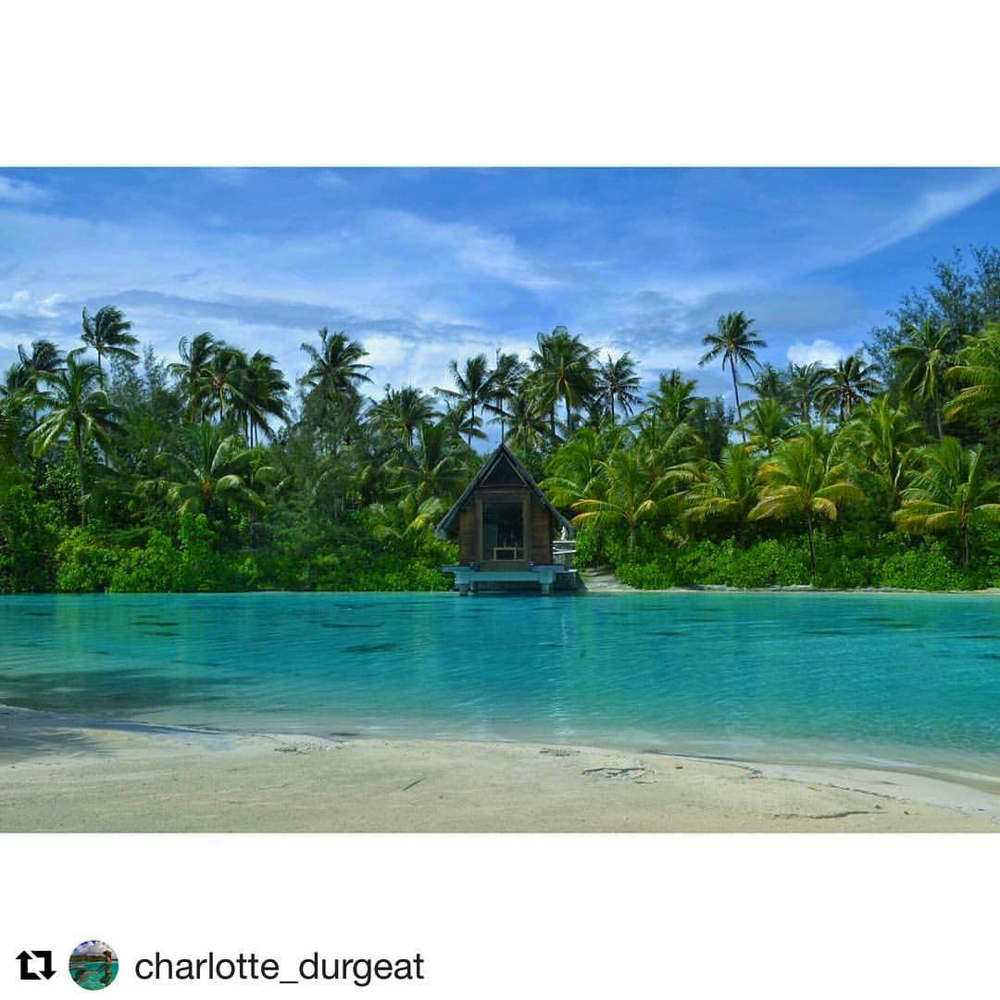

📍Bora Bora | Follow TravelTuesday to discover more places ✈️ #traveltuesday if you want to be featured
____________________________________

#DarlingEscapes #GirlsWhoTravel #TravelGram #LoveToTravel #TravelDiary  #ViewFromTheTop  #SimplyAdventure #ABMTravelbug #WeAreTravelGirls  #DameTraveler #FlashesofDelight #OpenMyWorld  #WheretoFindMe #MyTinyAtlas #BeautifulDestinations #travel #destinations #TraveltheWorld #vacantion #amazingplaces

a boat is docked in the water near a beach 
 "Seaside tranquility <unk> </s>



In [ ]:
img = Image.open(insta.loc[1, ['Image']][0])
img.show()
print(insta.loc[1, ['Real_insta_caption']][0])
print(insta.loc[1, ['Generated_descriptive_caption']][0])
print(insta.loc[1, ['stylised_captions']][0])
print()

In [ ]:
bleu_score = []
smoothing = SmoothingFunction()
for i in range(len(insta)):
  # print(test[i]['Original Caption'], ' space ',model_outputs[i])
  bleu_score.append(round(sentence_bleu([insta.loc[i, ['Generated_descriptive_caption']][0]], insta.loc[i, ['stylised_captions']][0], smoothing_function = smoothing.method1), 4))

In [ ]:
avg_bleu_score = sum(bleu_score)/len(bleu_score)

In [ ]:
avg_bleu_score

0.33836194302410555

In [ ]:
insta['stylised_bleu_score'] = bleu_score

In [33]:
pickle.dump(coco, open('/content/drive/MyDrive/Information Retrieval Project/FINAL SUBMISSION FILES/coco_stylised_df.pkl', 'wb'))
pickle.dump(conceptual, open('/content/drive/MyDrive/Information Retrieval Project/FINAL SUBMISSION FILES/conceptual_stylised_df.pkl', 'wb'))

In [ ]:
pickle.dump(insta, open('/content/drive/MyDrive/Information Retrieval Project/FINAL SUBMISSION FILES/insta_stylised_df.pkl', 'wb'))

### flickr dataset

In [34]:
flickr = pickle.load(open('/content/drive/MyDrive/Information Retrieval Project/FINAL SUBMISSION FILES/flickr_df.pkl', 'rb'))

In [ ]:
flickr

,Image,Captions,Generated_descriptive_caption,bleu_score,rouge_score,meteor_score
0,/content/drive/MyDrive/Information Retrieval P...,[sos two young guys with shaggy hair look at ...,a woman standing next to a fence with a bat,0.563806,0.120000,0.169492
1,/content/drive/MyDrive/Information Retrieval P...,[sos several men in hard hats are operating a...,a crane is attached to a crane on a boat,0.312402,0.180000,0.228659
2,/content/drive/MyDrive/Information Retrieval P...,[sos a child in a pink dress is climbing up a...,a little girl standing next to a wooden fence,0.721007,0.444444,0.488889
3,/content/drive/MyDrive/Information Retrieval P...,[sos someone in a blue shirt and hat is stand...,a man is standing on a ledge outside a building,0.758178,0.500000,0.446000
4,/content/drive/MyDrive/Information Retrieval P...,[sos two men one in a gray shirt one in a bla...,a man in a kitchen with a bowl of food,0.722253,0.220000,0.377966
...,...,...,...,...,...,...
995,/content/drive/MyDrive/Information Retrieval P...,[sos a little girl on the street in a yellowi...,a woman in a pink dress is holding a pink fire...,0.552104,0.433333,0.283734
996,/content/drive/MyDrive/Information Retrieval P...,[sos two people a boy in yellow and girl in b...,a man and woman standing next to each other on...,0.661729,0.366667,0.253061
997,/content/drive/MyDrive/Information Retrieval P...,[sos a shirtless man is fishing standing on l...,a man standing on a pier next to a body of water,0.643275,0.300000,0.339382
998,/content/drive/MyDrive/Information Retrieval P...,[sos a young girl floats on her back in water...,a woman in a red bikini is in the water,0.571046,0.340000,0.351181


In [35]:
captions = flickr.loc[:, ['Generated_descriptive_caption']]

In [36]:
captions = captions.applymap(lambda x: '<SOS> ' + x + '<EOS>')
captions = captions.applymap(lambda x: 'write creatively: ' + x)

In [37]:
stylised_captions = tokenizer(captions['Generated_descriptive_caption'].to_list(), max_length = 30, truncation = True, padding = True, return_tensors = 'pt').input_ids.cuda()

In [38]:
stylised_captions = model.generate(stylised_captions)

/usr/local/lib/python3.9/dist-packages/transformers/generation/utils.py:1313: UserWarning: Using `max_length`'s default (20) to control the generation length. This behaviour is deprecated and will be removed from the config in v5 of Transformers -- we recommend using `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


In [39]:
stylised_captions = tokenizer.batch_decode(stylised_captions)

In [40]:
flickr['stylised_captions'] = stylised_captions

In [41]:
flickr.loc[:, ['stylised_captions']] = flickr.loc[:, ['stylised_captions']].applymap(lambda x: x.replace('<pad>', ''))
flickr.loc[:, ['stylised_captions']] = flickr.loc[:, ['stylised_captions']].applymap(lambda x: x.replace('<SOS>', ''))
flickr.loc[:, ['stylised_captions']] = flickr.loc[:, ['stylised_captions']].applymap(lambda x: x.replace('<EOS>', ''))

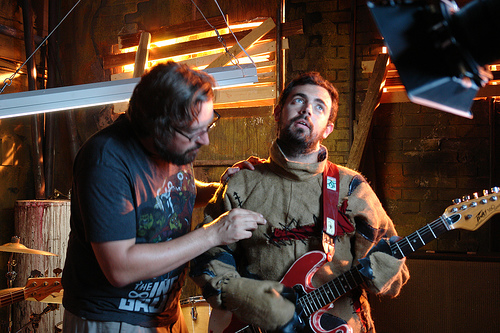

['sos  two people in the photo are playing the guitar and the other is poking at him  eos', 'sos  a man in green holds a guitar while the other man observes his shirt  eos', 'sos  a man is fixing the guitar players costume  eos', 'sos  a guy stitching up another man s coat  eos', 'sos  the two boys playing guitar eos']
a man in a band playing a guitar 
 "Musical adventure <unk> </s>



In [ ]:
img = Image.open(flickr.loc[5, ['Image']][0])
img.show()
print(flickr.loc[5, ['Captions']][0])
print(flickr.loc[5, ['Generated_descriptive_caption']][0])
print(flickr.loc[5, ['stylised_captions']][0])
print()

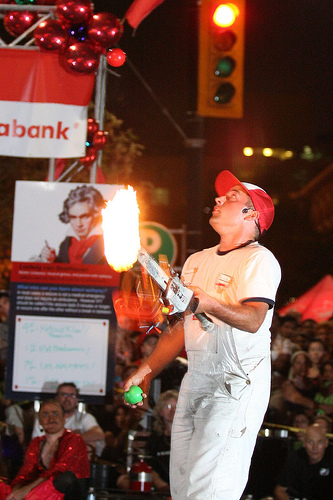

['sos  a man dressed in white overalls with a red cap juggling a green ball and flaming torch in front of a crowd of onlookers  eos', 'sos  a male in a red hat playing with a chainsaw on fire and a green ball in his hand in front of a crowd  eos', 'sos  a man wearing white overalls is juggling dangerous objects  eos', 'sos  man with hat juggling in front of a captivated audience  eos', 'sos  a man is performing in front of many of peoples  eos']
a man in a baseball uniform swinging a bat 
 "Breaking through the crowd with pride <unk> </s>



In [ ]:
img = Image.open(flickr.loc[902, ['Image']][0])
img.show()
print(flickr.loc[902, ['Captions']][0])
print(flickr.loc[902, ['Generated_descriptive_caption']][0])
print(flickr.loc[902, ['stylised_captions']][0])
print()

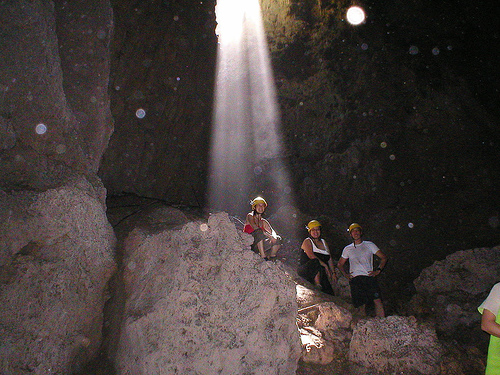

['sos  spelunkers pose inside a rock cavern while bathed in sunlight from the surface  eos', 'sos  shaft of light in a cave shows three spelunkers eos', 'sos  three rock climbers are posing on big rocks  eos', 'sos  people stand inside a rock dome  eos', 'sos  three people sit in a cave  eos']
people standing on top of a rock 
 "Rock climbing is a beautiful thing <unk> </s>



In [ ]:
img = Image.open(flickr.loc[265, ['Image']][0])
img.show()
print(flickr.loc[265, ['Captions']][0])
print(flickr.loc[265, ['Generated_descriptive_caption']][0])
print(flickr.loc[265, ['stylised_captions']][0])
print()

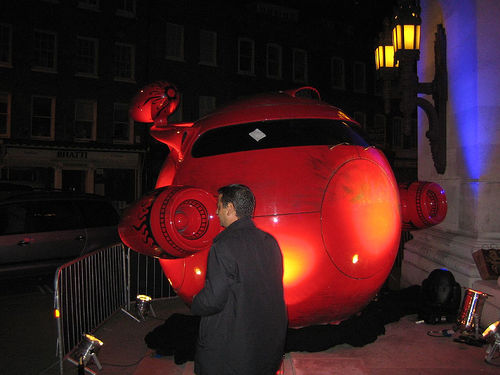

['sos  a man in a black coat walks past a red spaceship with a parking ticket stuck to its window  eos', 'sos  a man is standing in front of a small red object that looks like a plane  eos', 'sos  a man wearing a black jacket is walking towards the street  eos', 'sos  a man in a black jacket is moving towards a street  eos', 'sos  man in black coat examining airplane nose  eos']
a man standing next to a red fire hydrant 
 "Firefighting thrill! Man standing next to a red fire hydrant



In [ ]:
img = Image.open(flickr.loc[69, ['Image']][0])
img.show()
print(flickr.loc[69, ['Captions']][0])
print(flickr.loc[69, ['Generated_descriptive_caption']][0])
print(flickr.loc[69, ['stylised_captions']][0])
print()

In [42]:
bleu_score = []
smoothing = SmoothingFunction()
for i in range(len(flickr)):
  # print(test[i]['Original Caption'], ' space ',model_outputs[i])
  bleu_score.append(round(sentence_bleu([flickr.loc[i, ['Generated_descriptive_caption']][0]], flickr.loc[i, ['stylised_captions']][0], smoothing_function = smoothing.method1), 4))

In [43]:
avg_bleu_score = sum(bleu_score)/len(bleu_score)
avg_bleu_score

0.28212879999999996

In [44]:
flickr['stylised_bleu_score'] = bleu_score

In [45]:
pickle.dump(flickr, open('/content/drive/MyDrive/Information Retrieval Project/FINAL SUBMISSION FILES/flickr_stylised_df.pkl', 'wb'))

In [46]:
coco = pickle.load(open('/content/drive/MyDrive/Information Retrieval Project/FINAL SUBMISSION FILES/coco_df.pkl', 'rb'))
coco_stylised = pickle.load(open('/content/drive/MyDrive/Information Retrieval Project/FINAL SUBMISSION FILES/coco_stylised_df.pkl', 'rb'))

In [47]:
coco_stylised['meteor_score'] = coco['meteor_score']

In [48]:
conceptual = pickle.load(open('/content/drive/MyDrive/Information Retrieval Project/FINAL SUBMISSION FILES/conceptual_df.pkl', 'rb'))
conceptual_stylised = pickle.load(open('/content/drive/MyDrive/Information Retrieval Project/FINAL SUBMISSION FILES/conceptual_stylised_df.pkl', 'rb'))

In [49]:
conceptual_stylised['meteor_score'] = conceptual['meteor_score']

In [50]:
flickr = pickle.load(open('/content/drive/MyDrive/Information Retrieval Project/FINAL SUBMISSION FILES/flickr_df.pkl', 'rb'))
flickr_stylised = pickle.load(open('/content/drive/MyDrive/Information Retrieval Project/FINAL SUBMISSION FILES/flickr_stylised_df.pkl', 'rb'))

In [51]:
flickr_stylised['meteor_score'] = flickr['meteor_score']

In [29]:
insta = pickle.load(open('/content/drive/MyDrive/Information Retrieval Project/FINAL SUBMISSION FILES/insta_df.pkl', 'rb'))
insta_stylised = pickle.load(open('/content/drive/MyDrive/Information Retrieval Project/FINAL SUBMISSION FILES/insta_stylised_df.pkl', 'rb'))

In [52]:
pickle.dump(coco_stylised, open('/content/drive/MyDrive/Information Retrieval Project/FINAL SUBMISSION FILES/coco_stylised_df.pkl', 'wb'))
pickle.dump(flickr_stylised, open('/content/drive/MyDrive/Information Retrieval Project/FINAL SUBMISSION FILES/flickr_stylised_df.pkl', 'wb'))
pickle.dump(conceptual_stylised, open('/content/drive/MyDrive/Information Retrieval Project/FINAL SUBMISSION FILES/conceptual_stylised_df.pkl', 'wb'))

In [53]:
flickr_stylised

,Image,Captions,Generated_descriptive_caption,bleu_score,rouge_score,meteor_score,stylised_captions,stylised_bleu_score
0,/content/drive/MyDrive/Information Retrieval P...,[sos two young guys with shaggy hair look at ...,a woman standing next to a fence with a bat,0.563806,0.120000,0.169492,"""Sweet and peaceful moment of a woman surroun...",0.2663
1,/content/drive/MyDrive/Information Retrieval P...,[sos several men in hard hats are operating a...,a crane is attached to a crane on a boat,0.312402,0.180000,0.228659,"""Cruising to new heights! <unk> </s>",0.0970
2,/content/drive/MyDrive/Information Retrieval P...,[sos a child in a pink dress is climbing up a...,a little girl standing next to a wooden fence,0.721007,0.444444,0.488889,"""Sweet and peaceful moment of a little girl e...",0.3371
3,/content/drive/MyDrive/Information Retrieval P...,[sos someone in a blue shirt and hat is stand...,a man is standing on a ledge outside a building,0.758178,0.500000,0.446000,"""Staying in the shadow of the cityscape <unk>...",0.1033
4,/content/drive/MyDrive/Information Retrieval P...,[sos two men one in a gray shirt one in a bla...,a man in a kitchen with a bowl of food,0.722253,0.220000,0.377966,"""Cheers to a healthy life! <unk> </s>",0.0449
...,...,...,...,...,...,...,...,...
995,/content/drive/MyDrive/Information Retrieval P...,[sos a little girl on the street in a yellowi...,a woman in a pink dress is holding a pink fire...,0.552104,0.433333,0.283734,Firefighter's dream: a woman in pink dress ho...,0.6412
996,/content/drive/MyDrive/Information Retrieval P...,[sos two people a boy in yellow and girl in b...,a man and woman standing next to each other on...,0.661729,0.366667,0.253061,Life is better by the lake <unk> </s>,0.1443
997,/content/drive/MyDrive/Information Retrieval P...,[sos a shirtless man is fishing standing on l...,a man standing on a pier next to a body of water,0.643275,0.300000,0.339382,"""Captivating moment of a man standing on a pi...",0.5706
998,/content/drive/MyDrive/Information Retrieval P...,[sos a young girl floats on her back in water...,a woman in a red bikini is in the water,0.571046,0.340000,0.351181,"""Sweat and serenity in the water"" </s>",0.3898


### add hashtag and emoji

In [54]:
coco_stylised = pickle.load(open('/content/drive/MyDrive/Information Retrieval Project/FINAL SUBMISSION FILES/coco_stylised_df.pkl', 'rb'))
flickr_stylised = pickle.load(open('/content/drive/MyDrive/Information Retrieval Project/FINAL SUBMISSION FILES/flickr_stylised_df.pkl', 'rb'))
conceptual_stylised = pickle.load(open('/content/drive/MyDrive/Information Retrieval Project/FINAL SUBMISSION FILES/conceptual_stylised_df.pkl', 'rb'))

In [55]:
captions = coco_stylised.loc[:, ['stylised_captions']]

In [56]:
captions = captions.applymap(lambda x: '<SOS> ' + x + '<EOS>')
captions = captions.applymap(lambda x: 'add emojis: ' + x)

In [57]:
stylised_captions = emoji_tokenizer(captions['stylised_captions'].to_list(), max_length = 30, truncation = True, padding = True, return_tensors = 'pt').input_ids.cuda()

In [58]:
captions = emoji_model.generate(stylised_captions)

/usr/local/lib/python3.9/dist-packages/transformers/generation/utils.py:1313: UserWarning: Using `max_length`'s default (20) to control the generation length. This behaviour is deprecated and will be removed from the config in v5 of Transformers -- we recommend using `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


In [59]:
captions = emoji_tokenizer.batch_decode(captions)

In [60]:
coco_stylised['emojis'] = captions

In [61]:
coco_stylised.loc[:, ['emojis']] = coco_stylised.loc[:, ['emojis']].applymap(lambda x: x.replace('<pad>', ''))
coco_stylised.loc[:, ['emojis']] = coco_stylised.loc[:, ['emojis']].applymap(lambda x: x.replace('<SOS>', ''))
coco_stylised.loc[:, ['emojis']] = coco_stylised.loc[:, ['emojis']].applymap(lambda x: x.replace('<EOS>', ''))
coco_stylised.loc[:, ['emojis']] = coco_stylised.loc[:, ['emojis']].applymap(lambda x: x.replace('</s>', ''))
coco_stylised.loc[:, ['stylised_captions']] = coco_stylised.loc[:, ['stylised_captions']].applymap(lambda x: x.replace('</s>', ''))

In [62]:
coco_stylised['stylised_captions_emoji'] = coco_stylised['stylised_captions'] + coco_stylised['emojis'] 

In [63]:
captions = conceptual_stylised.loc[:, ['stylised_captions']]

In [64]:
captions = captions.applymap(lambda x: '<SOS> ' + x + '<EOS>')
captions = captions.applymap(lambda x: 'add emojis: ' + x)

In [65]:
stylised_captions = emoji_tokenizer(captions['stylised_captions'].to_list(), max_length = 30, truncation = True, padding = True, return_tensors = 'pt').input_ids.cuda()

In [66]:
captions = emoji_model.generate(stylised_captions)

/usr/local/lib/python3.9/dist-packages/transformers/generation/utils.py:1313: UserWarning: Using `max_length`'s default (20) to control the generation length. This behaviour is deprecated and will be removed from the config in v5 of Transformers -- we recommend using `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


In [67]:
captions = emoji_tokenizer.batch_decode(captions)

In [68]:
conceptual_stylised['emojis'] = captions

In [69]:
conceptual_stylised.loc[:, ['emojis']] = conceptual_stylised.loc[:, ['emojis']].applymap(lambda x: x.replace('<pad>', ''))
conceptual_stylised.loc[:, ['emojis']] = conceptual_stylised.loc[:, ['emojis']].applymap(lambda x: x.replace('<SOS>', ''))
conceptual_stylised.loc[:, ['emojis']] = conceptual_stylised.loc[:, ['emojis']].applymap(lambda x: x.replace('<EOS>', ''))
conceptual_stylised.loc[:, ['emojis']] = conceptual_stylised.loc[:, ['emojis']].applymap(lambda x: x.replace('</s>', ''))
conceptual_stylised.loc[:, ['stylised_captions']] = conceptual_stylised.loc[:, ['stylised_captions']].applymap(lambda x: x.replace('</s>', ''))

In [70]:
conceptual_stylised['stylised_captions_emoji'] = conceptual_stylised['stylised_captions'] + conceptual_stylised['emojis'] 

In [71]:
captions = flickr_stylised.loc[:, ['stylised_captions']]

In [72]:
captions = captions.applymap(lambda x: '<SOS> ' + x + '<EOS>')
captions = captions.applymap(lambda x: 'add emojis: ' + x)

In [73]:
stylised_captions = emoji_tokenizer(captions['stylised_captions'].to_list(), max_length = 30, truncation = True, padding = True, return_tensors = 'pt').input_ids.cuda()

In [74]:
captions = emoji_model.generate(stylised_captions)

/usr/local/lib/python3.9/dist-packages/transformers/generation/utils.py:1313: UserWarning: Using `max_length`'s default (20) to control the generation length. This behaviour is deprecated and will be removed from the config in v5 of Transformers -- we recommend using `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


In [75]:
captions = emoji_tokenizer.batch_decode(captions)

In [76]:
flickr_stylised['emojis'] = captions

In [77]:
flickr_stylised.loc[:, ['emojis']] = flickr_stylised.loc[:, ['emojis']].applymap(lambda x: x.replace('<pad>', ''))
flickr_stylised.loc[:, ['emojis']] = flickr_stylised.loc[:, ['emojis']].applymap(lambda x: x.replace('<SOS>', ''))
flickr_stylised.loc[:, ['emojis']] = flickr_stylised.loc[:, ['emojis']].applymap(lambda x: x.replace('<EOS>', ''))
flickr_stylised.loc[:, ['emojis']] = flickr_stylised.loc[:, ['emojis']].applymap(lambda x: x.replace('</s>', ''))
flickr_stylised.loc[:, ['stylised_captions']] = flickr_stylised.loc[:, ['stylised_captions']].applymap(lambda x: x.replace('</s>', ''))

In [78]:
flickr_stylised['stylised_captions_emoji'] = flickr_stylised['stylised_captions'] + flickr_stylised['emojis'] 

In [79]:
hashtag_tokenizer = AutoTokenizer.from_pretrained("/content/drive/MyDrive/Information Retrieval Project/Instagram worthy captions dataset/t5_hashtag_model_10_epochs_2")

In [80]:
flickr_stylised

,Image,Captions,Generated_descriptive_caption,bleu_score,rouge_score,meteor_score,stylised_captions,stylised_bleu_score,emojis,stylised_captions_emoji
0,/content/drive/MyDrive/Information Retrieval P...,[sos two young guys with shaggy hair look at ...,a woman standing next to a fence with a bat,0.563806,0.120000,0.169492,"""Sweet and peaceful moment of a woman surroun...",0.2663,🌟 🎨,"""Sweet and peaceful moment of a woman surroun..."
1,/content/drive/MyDrive/Information Retrieval P...,[sos several men in hard hats are operating a...,a crane is attached to a crane on a boat,0.312402,0.180000,0.228659,"""Cruising to new heights! <unk>",0.0970,❤ 🌟,"""Cruising to new heights! <unk> ❤ 🌟"
2,/content/drive/MyDrive/Information Retrieval P...,[sos a child in a pink dress is climbing up a...,a little girl standing next to a wooden fence,0.721007,0.444444,0.488889,"""Sweet and peaceful moment of a little girl e...",0.3371,🎨 ❤,"""Sweet and peaceful moment of a little girl e..."
3,/content/drive/MyDrive/Information Retrieval P...,[sos someone in a blue shirt and hat is stand...,a man is standing on a ledge outside a building,0.758178,0.500000,0.446000,"""Staying in the shadow of the cityscape <unk>",0.1033,❤,"""Staying in the shadow of the cityscape <unk> ❤"
4,/content/drive/MyDrive/Information Retrieval P...,[sos two men one in a gray shirt one in a bla...,a man in a kitchen with a bowl of food,0.722253,0.220000,0.377966,"""Cheers to a healthy life! <unk>",0.0449,🌟 ❤,"""Cheers to a healthy life! <unk> 🌟 ❤"
...,...,...,...,...,...,...,...,...,...,...
995,/content/drive/MyDrive/Information Retrieval P...,[sos a little girl on the street in a yellowi...,a woman in a pink dress is holding a pink fire...,0.552104,0.433333,0.283734,Firefighter's dream: a woman in pink dress ho...,0.6412,🎉,Firefighter's dream: a woman in pink dress ho...
996,/content/drive/MyDrive/Information Retrieval P...,[sos two people a boy in yellow and girl in b...,a man and woman standing next to each other on...,0.661729,0.366667,0.253061,Life is better by the lake <unk>,0.1443,❄,Life is better by the lake <unk> ❄
997,/content/drive/MyDrive/Information Retrieval P...,[sos a shirtless man is fishing standing on l...,a man standing on a pier next to a body of water,0.643275,0.300000,0.339382,"""Captivating moment of a man standing on a pi...",0.5706,🌊 🌊,"""Captivating moment of a man standing on a pi..."
998,/content/drive/MyDrive/Information Retrieval P...,[sos a young girl floats on her back in water...,a woman in a red bikini is in the water,0.571046,0.340000,0.351181,"""Sweat and serenity in the water""",0.3898,🌟,"""Sweat and serenity in the water"" 🌟"


In [92]:
captions = conceptual_stylised.loc[:, ['stylised_captions']]
captions = captions.applymap(lambda x: '<SOS> ' + x + '<EOS>')
captions = captions.applymap(lambda x: 'add emojis: ' + x)
stylised_captions = hashtag_tokenizer(captions['stylised_captions'].to_list(), max_length = 30, truncation = True, padding = True, return_tensors = 'pt').input_ids.cuda()
captions = hashtag_model.generate(stylised_captions)
captions = emoji_tokenizer.batch_decode(captions)
conceptual_stylised['hashtags'] = captions
conceptual_stylised.loc[:, ['hashtags']] = conceptual_stylised.loc[:, ['hashtags']].applymap(lambda x: x.replace('<pad>', ''))
conceptual_stylised.loc[:, ['hashtags']] = conceptual_stylised.loc[:, ['hashtags']].applymap(lambda x: x.replace('<SOS>', ''))
conceptual_stylised.loc[:, ['hashtags']] = conceptual_stylised.loc[:, ['hashtags']].applymap(lambda x: x.replace('<EOS>', ''))
conceptual_stylised.loc[:, ['hashtags']] = conceptual_stylised.loc[:, ['hashtags']].applymap(lambda x: x.replace('</s>', ''))
conceptual_stylised.loc[:, ['stylised_captions']] = conceptual_stylised.loc[:, ['stylised_captions']].applymap(lambda x: x.replace('</s>', ''))
conceptual_stylised['stylised_captions_final'] = conceptual_stylised['stylised_captions_emoji'] + conceptual_stylised['hashtags'] 

/usr/local/lib/python3.9/dist-packages/transformers/generation/utils.py:1313: UserWarning: Using `max_length`'s default (20) to control the generation length. This behaviour is deprecated and will be removed from the config in v5 of Transformers -- we recommend using `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


In [93]:
captions = flickr_stylised.loc[:, ['stylised_captions']]
captions = captions.applymap(lambda x: '<SOS> ' + x + '<EOS>')
captions = captions.applymap(lambda x: 'add emojis: ' + x)
stylised_captions = hashtag_tokenizer(captions['stylised_captions'].to_list(), max_length = 30, truncation = True, padding = True, return_tensors = 'pt').input_ids.cuda()
captions = hashtag_model.generate(stylised_captions)
captions = emoji_tokenizer.batch_decode(captions)
flickr_stylised['hashtags'] = captions
flickr_stylised.loc[:, ['hashtags']] = flickr_stylised.loc[:, ['hashtags']].applymap(lambda x: x.replace('<pad>', ''))
flickr_stylised.loc[:, ['hashtags']] = flickr_stylised.loc[:, ['hashtags']].applymap(lambda x: x.replace('<SOS>', ''))
flickr_stylised.loc[:, ['hashtags']] = flickr_stylised.loc[:, ['hashtags']].applymap(lambda x: x.replace('<EOS>', ''))
flickr_stylised.loc[:, ['hashtags']] = flickr_stylised.loc[:, ['hashtags']].applymap(lambda x: x.replace('</s>', ''))
flickr_stylised.loc[:, ['stylised_captions']] = flickr_stylised.loc[:, ['stylised_captions']].applymap(lambda x: x.replace('</s>', ''))
flickr_stylised['stylised_captions_final'] = flickr_stylised['stylised_captions_emoji'] + flickr_stylised['hashtags'] 

/usr/local/lib/python3.9/dist-packages/transformers/generation/utils.py:1313: UserWarning: Using `max_length`'s default (20) to control the generation length. This behaviour is deprecated and will be removed from the config in v5 of Transformers -- we recommend using `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


In [94]:
captions = coco_stylised.loc[:, ['stylised_captions']]
captions = captions.applymap(lambda x: '<SOS> ' + x + '<EOS>')
captions = captions.applymap(lambda x: 'add emojis: ' + x)
stylised_captions = hashtag_tokenizer(captions['stylised_captions'].to_list(), max_length = 30, truncation = True, padding = True, return_tensors = 'pt').input_ids.cuda()
captions = hashtag_model.generate(stylised_captions)
captions = emoji_tokenizer.batch_decode(captions)
coco_stylised['hashtags'] = captions
coco_stylised.loc[:, ['hashtags']] = coco_stylised.loc[:, ['hashtags']].applymap(lambda x: x.replace('<pad>', ''))
coco_stylised.loc[:, ['hashtags']] = coco_stylised.loc[:, ['hashtags']].applymap(lambda x: x.replace('<SOS>', ''))
coco_stylised.loc[:, ['hashtags']] = coco_stylised.loc[:, ['hashtags']].applymap(lambda x: x.replace('<EOS>', ''))
coco_stylised.loc[:, ['hashtags']] = coco_stylised.loc[:, ['hashtags']].applymap(lambda x: x.replace('</s>', ''))
coco_stylised.loc[:, ['stylised_captions']] = coco_stylised.loc[:, ['stylised_captions']].applymap(lambda x: x.replace('</s>', ''))
coco_stylised['stylised_captions_final'] = coco_stylised['stylised_captions_emoji'] + coco_stylised['hashtags'] 

/usr/local/lib/python3.9/dist-packages/transformers/generation/utils.py:1313: UserWarning: Using `max_length`'s default (20) to control the generation length. This behaviour is deprecated and will be removed from the config in v5 of Transformers -- we recommend using `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


In [96]:
coco_stylised

,url,captions,Generated_descriptive_caption,bleu_score,rouge_score,meteor_score,stylised_captions,stylised_bleu_score,emojis,stylised_captions_emoji,hashtags,stylised_captions_final
0,http://images.cocodataset.org/val2014/COCO_val...,[A man with a red helmet on a small moped on a...,a man riding a motorcycle on a dirt road,0.986925,0.777778,0.277778,"""Riding through the dirt with my friends""",0.2528,🎉,"""Riding through the dirt with my friends"" 🎉",#WildLife #RitualTre ures #Morn,"""Riding through the dirt with my friends"" 🎉 ..."
1,http://images.cocodataset.org/val2014/COCO_val...,[A woman wearing a net on her head cutting a c...,a woman cutting a cake with a knife,0.810337,0.625000,0.294118,"""Cake magic! A woman slicing a cake with a",0.5426,🎨 🎨,"""Cake magic! A woman slicing a cake with a🎨 🎨",#CakeCreation,"""Cake magic! A woman slicing a cake with a🎨 🎨..."
2,http://images.cocodataset.org/val2014/COCO_val...,[A child holding a flowered umbrella and petti...,a young boy holding an umbrella while standing...,0.890771,0.363636,0.250000,"""Under the umbrella, I can see the beauty of ...",0.2235,❄,"""Under the umbrella, I can see the beauty of ...",#BoardwalkView #NatureLover #ScenicViews,"""Under the umbrella, I can see the beauty of ..."
3,http://images.cocodataset.org/val2014/COCO_val...,[A young boy standing in front of a computer k...,a young boy is using a computer while sitting ...,0.714911,0.416667,0.238095,"""Studying for the future with a laptop and a ...",0.1232,🎨 🎉,"""Studying for the future with a laptop and a ...",#TravelP sion #DreamHome,"""Studying for the future with a laptop and a ..."
4,http://images.cocodataset.org/val2014/COCO_val...,[a boy wearing headphones using one computer i...,a boy in a black shirt and a black and white c...,0.468980,0.416667,0.238095,"""Sweet and confident, a boy in black shirt an...",0.6537,🎨 ❤,"""Sweet and confident, a boy in black shirt an...",#SweetAndStylish #ComfortableBoy #Coffee,"""Sweet and confident, a boy in black shirt an..."
...,...,...,...,...,...,...,...,...,...,...,...,...
995,http://images.cocodataset.org/val2014/COCO_val...,[A street with various buildings on each side ...,a building with a clock on the side of it,0.807772,0.400000,0.263158,"""Clock tower vibes! <unk>",0.1162,❤ ❤,"""Clock tower vibes! <unk> ❤ ❤",#TimelessElegance #LetterLogo #ClockRoomKeepers,"""Clock tower vibes! <unk> ❤ ❤ #TimelessElega..."
996,http://images.cocodataset.org/val2014/COCO_val...,[Two men standing on a very tall clock tower w...,two men are standing on a tower with a clock,0.915725,0.900000,0.263158,"""Clock towers are a symbol of progress and ac...",0.2592,❤,"""Clock towers are a symbol of progress and ac...",#ClockRoomCharm #VectorArt #TimelessDesign,"""Clock towers are a symbol of progress and ac..."
997,http://images.cocodataset.org/val2014/COCO_val...,"[The large, very old jar is on display behind ...",a vase with a picture of a man on it,0.298106,0.100000,0.263158,"""A man's vase with a picture on it, a symbol ...",0.5434,🎨 🎨,"""A man's vase with a picture on it, a symbol ...",#Ar ticIllustration #PencilDrawing,"""A man's vase with a picture on it, a symbol ..."
998,http://images.cocodataset.org/val2014/COCO_val...,[A vase filled with red and white flowers on t...,a vase filled with flowers sitting on a table,0.915069,0.888889,0.277778,"""A beautiful display of flowers in a vase, sh...",0.2824,🎨 🎨,"""A beautiful display of flowers in a vase, sh...",#BayLife #NatureLover #WildAndFre,"""A beautiful display of flowers in a vase, sh..."


In [97]:
flickr_stylised.drop(['stylised_captions', 'stylised_captions_emoji', 'emojis', 'hashtags'], axis = 1, inplace = True)

In [99]:
coco_stylised.drop(['stylised_captions', 'stylised_captions_emoji', 'emojis', 'hashtags'], axis = 1, inplace = True)
conceptual_stylised.drop(['stylised_captions', 'stylised_captions_emoji', 'emojis', 'hashtags'], axis = 1, inplace = True)

In [101]:
flickr_stylised.loc[:, ['stylised_captions_final']] = flickr_stylised.loc[:, ['stylised_captions_final']].applymap(lambda x: x.replace('<unk>', ''))
coco_stylised.loc[:, ['stylised_captions_final']] = flickr_stylised.loc[:, ['stylised_captions_final']].applymap(lambda x: x.replace('<unk>', ''))
conceptual_stylised.loc[:, ['stylised_captions_final']] = flickr_stylised.loc[:, ['stylised_captions_final']].applymap(lambda x: x.replace('<unk>', ''))

In [102]:
pickle.dump(flickr_stylised, open('/content/drive/MyDrive/Information Retrieval Project/FINAL SUBMISSION FILES/flickr_stylised_df.pkl', 'wb'))
pickle.dump(coco_stylised, open('/content/drive/MyDrive/Information Retrieval Project/FINAL SUBMISSION FILES/coco_stylised_df.pkl', 'wb'))
pickle.dump(conceptual_stylised, open('/content/drive/MyDrive/Information Retrieval Project/FINAL SUBMISSION FILES/conceptual_stylised_df.pkl', 'wb'))